In [1]:
### Load in the data 

In [2]:
import pandas as pd
training_data = pd.read_parquet('/Users/carl/Development/py-archaeology/training.parquet')
training_data.sample(10)

,Category,Text
11151,comp.windows.x,"\n> If I use Xt, all \n> O'Reilly has to say i..."
6019,rec.sport.hockey,"(Detroit, April 19)\n\nIn a development that s..."
8413,sci.med,"In article <35004@castle.ed.ac.uk>, gtclark@fe..."
14840,sci.electronics,"Used, good condition:\nHitachi V-422 40MHz Dua..."
14876,sci.electronics,> Why does a lead acid battery discharge and...
9378,talk.politics.misc,aguilar@helium.gas.uug.arizona.edu (christophe...
13434,comp.sys.ibm.pc.hardware,david@c-cat.UUCP (Dave) write:\n>are we talkin...
12531,comp.graphics,"In article <1qflpk$re1@usenet.INS.CWRU.Edu>, m..."
859,talk.politics.mideast,"In <1slm8r$dnk@terminator.rs.itd.umich.edu>, j..."
6394,rec.sport.hockey,In article <22APR93.02956996.0062@UNBVM1.CSD.U...


We want to transform each of the messages into a numeric vector. One way to do this would be to associate a space in a bit vector with every possible word. We could set each bit to `True` or `1` if the corresponding word appears in that message, and `0` or `False` otherwise. In practice this is not practical because of the huge memory requirements. Instead we use a 'hashing vectoriser' which _hashes_ the words to vectors of a fixed, finite number of bits. 

You can see that many of the messages contain non-standard words or character strings such as email addresses. It is common practice to ignore such words during the feature engineering stage. We do this by setting a 'token_pattern' parameter to ensure that only standard words are hashed. 

We also want to remove any 'stop words' from the text. We do this by setting `stop_words='english'`.


In [3]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' within the document, with respect to the set of documents. 

In [4]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

### Visualise

In [5]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [6]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
3387,0.187986,-0.088462
13364,0.171618,-0.089038
12499,0.261186,-0.094861
6105,0.169646,0.151654
10794,0.114646,-0.018995
8694,0.355612,-0.076393
4861,0.137204,0.062938
2495,0.179894,-0.040147
5511,0.089723,0.063987
13696,0.269837,-0.075023


In [7]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

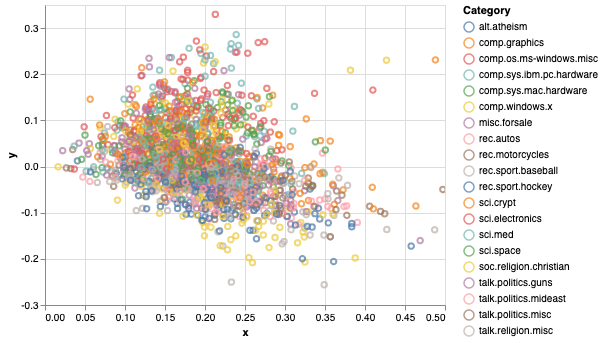

In [8]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Category").mark_point().interactive()

In [9]:
#No structure. Why?

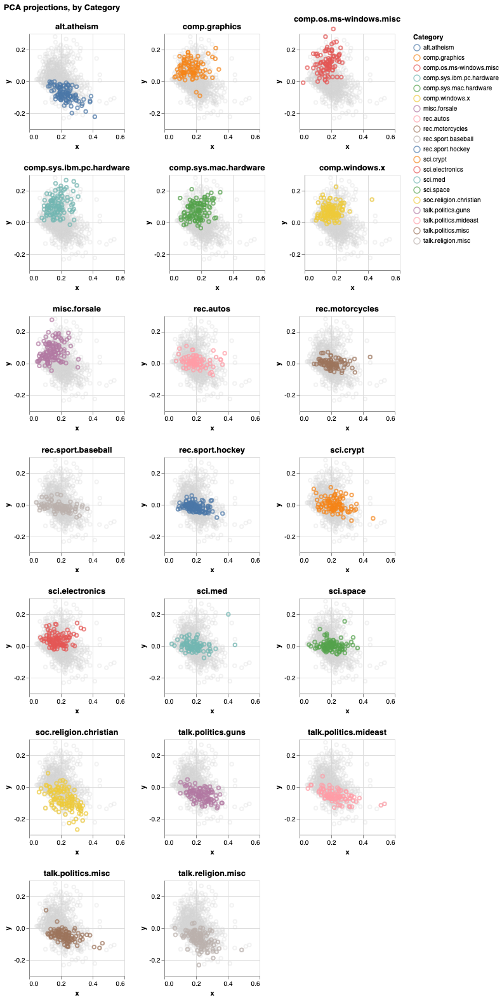

In [10]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Category:N'
)

## Make gray points for background
chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")


def overlay_make_chart(base_chart, category, options, chart1):
    title = category
    chart2 = base_chart\
      .transform_filter(datum.Category == category)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, category, options, chart1) \
          for category in sorted(data.Category.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

In [11]:
##okay good - looks better. 

In [12]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

In [13]:
training_vecs = feat_pipeline.fit_transform(training_data["Text"])

In [17]:
# If not yet installed - add xgboost module:
# pip install xgboost

# On MacOS, add dependency:
# brew install libomp

In [15]:
from xgboost import XGBClassifier

In [16]:
%%time

XGB_TREE_METHOD='hist'
xgb = XGBClassifier(tree_method=XGB_TREE_METHOD, 
                    # num_parallel_tree=16, 
                    n_estimators=100, 
                    max_depth=3, 
                    colsample_bynode=0.3, 
                    colsample_bytree=0.3, 
                    subsample=1, 
                    reg_alpha=1)

xgb.fit(training_vecs, training_data["Category"])

CPU times: user 15min 43s, sys: 34.6 s, total: 16min 18s
Wall time: 1min 12s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=0.3, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=1,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='hist', validate_parameters=1, verbosity=None)

In [18]:
xgb.score(training_vecs, training_data["Category"])

0.8830572883057288

In [22]:
testing_data = pd.read_parquet('/Users/carl/Development/py-archaeology/testing.parquet')
testing_vecs=feat_pipeline.transform(testing_data["Text"])
xgb.score(testing_vecs, testing_data["Category"])

0.721599464614355

In [23]:
from mlworkflows import plot

df, chart =plot.confusion_matrix(testing_data["Category"], xgb.predict(testing_vecs))

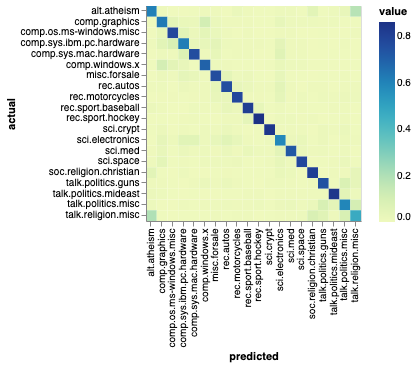

In [24]:
chart

In [25]:
from sklearn.metrics import classification_report
print(classification_report(testing_data["Category"], xgb.predict(testing_vecs)))

                          precision    recall  f1-score   support

             alt.atheism       0.62      0.61      0.61       284
           comp.graphics       0.60      0.63      0.61       303
 comp.os.ms-windows.misc       0.76      0.77      0.77       293
comp.sys.ibm.pc.hardware       0.62      0.61      0.62       303
   comp.sys.mac.hardware       0.76      0.76      0.76       286
          comp.windows.x       0.67      0.69      0.68       280
            misc.forsale       0.71      0.76      0.74       305
               rec.autos       0.70      0.76      0.73       300
         rec.motorcycles       0.79      0.78      0.78       317
      rec.sport.baseball       0.80      0.81      0.80       291
        rec.sport.hockey       0.89      0.86      0.88       310
               sci.crypt       0.92      0.84      0.88       303
         sci.electronics       0.51      0.58      0.54       274
                 sci.med       0.79      0.72      0.76       314
         

In [27]:
# pip install cloudpickle

In [28]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")

In [29]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")